#  A standardized comparison of urban green space mapping through remote sensing for Frankfurt, Germany
# Urban green space classification using CATBOOST

In [ ]:
!pip install numpy==1.25.2

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
!pip install catboost

In [ ]:
from catboost import CatBoostClassifier
from sklearn.metrics import classification_report, roc_auc_score
from catboost import Pool

In [ ]:
# Install required packages
!pip install pyrsgis
!pip install rasterio
!pip install focal-loss
!pip install segmentation_models

In [ ]:
# Install the DagsHub client
!pip install -q dagshub


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.1/260.1 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.6/139.6 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 96.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.2/203.2 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.4/84.4 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.3/74.3 kB 4.6 MB/s eta 0:00:00


In [ ]:
from dagshub.data_engine import datasources
ds = datasources.get('Omdena/FrankfurtGermanyChapter_UrbanGreenSpaceMappping', 'MULC')

In [ ]:
!dagshub download Omdena/FrankfurtGermanyChapter_UrbanGreenSpaceMappping MULC /content/MULC

In [ ]:
import os
import numpy as np
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

In [ ]:
#  paths to the folders
image_folder ='/content/MULC/VBWVA_8R'
mask_folder ='/content/MULC/VBWVA_8R_masks'


In [ ]:
#  list of files in each folder- ensuring that the image files and mask files are aligned correctly
image_files = sorted(os.listdir(image_folder))
mask_files = sorted(os.listdir(mask_folder))

# Load images and masks using rasterio
images = []
masks = []

In [ ]:
# Load images (only the first 12 bands)
for img_file in image_files:
    img_path = os.path.join(image_folder, img_file)
    try:
        with rasterio.open(img_path) as src:
            img = src.read()  # Read all bands (numpy array- bands height with)
            img = img[:12, :, :]  # Select only the first 12 bands
            images.append(img)
    except Exception as e:
        print(f"Error loading {img_file}: {e}")

# Load masks
for msk_file in mask_files:
    msk_path = os.path.join(mask_folder, msk_file)
    try:
        with rasterio.open(msk_path) as src:
            msk = src.read()  # Read all channels (numpy array)
            masks.append(msk)
    except Exception as e:
        print(f"Error loading {msk_file}: {e}")

In [ ]:
# Convert to numpy arrays for further processing

images = np.array(images) #
masks = np.array(masks)

print(f"Loaded {len(images)} images and {len(masks)} masks.")
print(f"Image shape: {images[0].shape}")  # (12, height, width)
print(f"Mask shape: {masks[0].shape}")    # (5, height, width)

Loaded 918 images and 918 masks.
Image shape: (12, 128, 128)
Mask shape: (5, 128, 128)


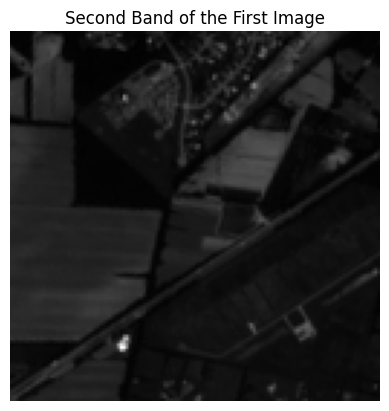

In [ ]:

plt.imshow(images[0][1], cmap='gray')
plt.title("Second Band of the First Image")
plt.axis('off')
plt.show()

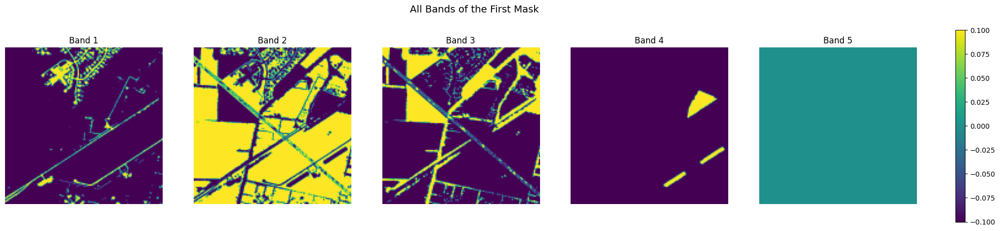

In [ ]:
# Get the number of bands in the first mask
num_bands = masks[0].shape[0]

# Create subplots for each band
fig, axes = plt.subplots(1, num_bands, figsize=(5 * num_bands, 5))

if num_bands == 1:
    axes = [axes]

# Plot each band
for i, ax in enumerate(axes):
    band = masks[0][i]
    im = ax.imshow(band, cmap='viridis')
    ax.set_title(f"Band {i+1}")
    ax.axis('off')

# Add a colorbar that applies to all subplots
fig.colorbar(im, ax=axes, fraction=0.02, pad=0.04)

# Set a main title for the entire figure
plt.suptitle("All Bands of the First Mask", fontsize=14)

# Show the plot
plt.show()

# Preprocessing and training the Catboost Model

## Step 1: Extract Relevant Bands from Masks
Extract bands 2 and 3 (low vegetation and trees) and combine them into a binary vegetation/non-vegetation mask.

In [ ]:
# Extract bands 2 and 3 from the masks
vegetation_mask = masks[:, 1:3, :, :]  # Bands 2 and 3 (low vegetation and trees)

# Combine bands 2 and 3 into a binary vegetation mask
vegetation_mask_binary = np.any(vegetation_mask, axis=1).astype(int)  # 1 for vegetation, 0 for non-vegetation

print("Shape of binary vegetation mask:", vegetation_mask_binary.shape)

Shape of binary vegetation mask: (918, 128, 128)


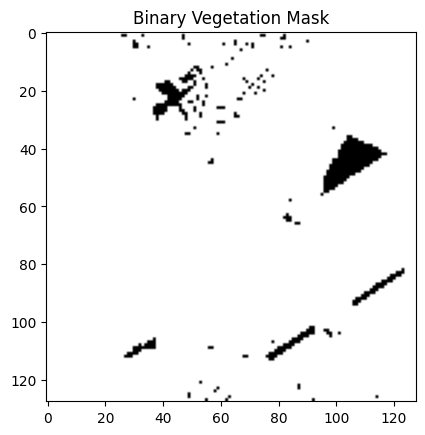

In [ ]:
# Display the first binary mask
plt.imshow(vegetation_mask_binary[0], cmap='gray')
plt.title("Binary Vegetation Mask")
plt.show()

## Step 2: Preprocess the Data
Flatten the images and prepare the target labels for binary classification.

In [ ]:
# For Binary Classification (Vegetation/Non-Vegetation):
# Flatten images
'''
images has the shape (num_images, 12, height, width), where:
num_images: Number of images.
12: Number of bands.
height, width: Spatial dimensions of each image.

transpose(0, 2, 3, 1) reorders the axes to (num_images, height, width, 12). This makes it easier to reshape the data into a 2D array.

reshape(-1, 12) flattens the spatial dimensions (height * width) into a single dimension, resulting in a shape of (num_images * height * width, 12).
Each row in X now represents a pixel with 12 band values.
'''
X = images.transpose(0, 2, 3, 1).reshape(-1, 12)  # Shape: (num_images * height * width, 12)

# Flatten binary vegetation mask
'''
vegetation_mask_binary has the shape (num_images, height, width).
reshape(-1) flattens the mask into a 1D array of shape (num_images * height * width,).
Each value in y_binary corresponds to a pixel in X.
'''
y_binary = vegetation_mask_binary.reshape(-1)  # Flatten into 1D array

# Define class labels for binary classification
class_labels_binary = {
    0: "Class 0: non-vegetation",
    1: "Class 1: vegetation",
}

print("Shape of X (flattened images):", X.shape)
print("Shape of y_binary (binary labels):", y_binary.shape)

Shape of X (flattened images): (15040512, 12)
Shape of y_binary (binary labels): (15040512,)


In [ ]:
# check for  class imbalance before training the model.

# Check unique values and their counts in y_binary
unique_values, counts = np.unique(y_binary, return_counts=True)
print("Unique values in y_binary:", unique_values)
print("Counts of each unique value:", counts)

# Calculate class percentages
class_percentages = counts / len(y_binary) * 100
print("Class percentages:", class_percentages)

# Class percentages: [17.3998066 82.6001934]- very unbalanced dataset

Unique values in y_binary: [0 1]
Counts of each unique value: [ 2617020 12423492]
Class percentages: [17.3998066 82.6001934]


# Train the CatBoost Model

In [ ]:
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from sklearn.metrics import classification_report, roc_auc_score
from catboost import Pool

In [ ]:
# Step 1: Split the data into training (70%), validation (15%), and test (15%)
# Use stratified sampling to preserve the class distribution
X_train, X_temp, y_train, y_temp = train_test_split(X, y_binary, test_size=0.3, random_state=42, stratify=y_binary
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)

# Step 2: Check class distribution in each set
print("Training set class distribution:")
print("Class 0 (non-vegetation):", (y_train == 0).sum())
print("Class 1 (vegetation):", (y_train == 1).sum())

print("\nValidation set class distribution:")
print("Class 0 (non-vegetation):", (y_val == 0).sum())
print("Class 1 (vegetation):", (y_val == 1).sum())

print("\nTest set class distribution:")
print("Class 0 (non-vegetation):", (y_test == 0).sum())
print("Class 1 (vegetation):", (y_test == 1).sum())

Training set class distribution:
Class 0 (non-vegetation): 1831914
Class 1 (vegetation): 8696444

Validation set class distribution:
Class 0 (non-vegetation): 392553
Class 1 (vegetation): 1863524

Test set class distribution:
Class 0 (non-vegetation): 392553
Class 1 (vegetation): 1863524


In [ ]:
# Step 3: Calculate class weights
total_samples = len(y_train)
class_weights = {0: (y_train == 1).sum() / total_samples,
                1: (y_train == 0).sum() / total_samples} # Inverse of class frequencies

In [ ]:
class_weights

{0: 0.8260019273660717, 1: 0.1739980726339283}

In [ ]:
 # Step 4: Create Pool objects for training and validation data
train_pool = Pool(X_train, y_train, cat_features=[])
val_pool = Pool(X_val, y_val, cat_features=[])

# Step 5: Initialize and train the CatBoost model with class weights and validation set
model = CatBoostClassifier(
    iterations=1200,
    learning_rate=0.1,
    depth=8,
    loss_function='Logloss',
    #task_type='GPU',
    verbose=100,
    class_weights=class_weights,  # Add class weights
    od_type="IncToDec", # Overfitting detector type
    eval_metric="F1", # the goal is to minimize the amount of vegetation missed by the model, F1 score might be more appropriate metrics to optimize
    od_wait=20   # Number of iterations to wait before stopping
)

model.fit(
    train_pool,
    eval_set=val_pool,
    use_best_model=True,      # Use the best model based on validation performance
    plot=True                # Display training progress plot
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8998317	test: 0.9001647	best: 0.9001647 (0)	total: 3.85s	remaining: 1h 16m 54s
100:	learn: 0.9074119	test: 0.9077097	best: 0.9077097 (100)	total: 5m 24s	remaining: 58m 54s
200:	learn: 0.9090134	test: 0.9091670	best: 0.9091670 (200)	total: 10m 44s	remaining: 53m 23s
300:	learn: 0.9099548	test: 0.9099941	best: 0.9099941 (300)	total: 16m 6s	remaining: 48m 7s
400:	learn: 0.9105210	test: 0.9104483	best: 0.9104524 (399)	total: 21m 30s	remaining: 42m 50s
500:	learn: 0.9110560	test: 0.9108492	best: 0.9108595 (498)	total: 26m 54s	remaining: 37m 33s
600:	learn: 0.9114904	test: 0.9111800	best: 0.9111800 (600)	total: 32m 21s	remaining: 32m 15s
700:	learn: 0.9119157	test: 0.9114182	best: 0.9114214 (698)	total: 37m 49s	remaining: 26m 55s
800:	learn: 0.9122559	test: 0.9116599	best: 0.9116637 (799)	total: 43m 21s	remaining: 21m 35s
900:	learn: 0.9125978	test: 0.9118741	best: 0.9118785 (893)	total: 48m 50s	remaining: 16m 12s
1000:	learn: 0.9129163	test: 0.9120358	best: 0.9120375 (979)	total

In [ ]:
# save the catboost model:
model.save_model('catboost.cbm')

# Evaluate the model on the test set

In [ ]:
# Step 5: Evaluate the model on the test set
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]  # Probabilities for ROC-AUC

# Print metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=class_labels_binary.values()))

print("\nROC-AUC Score:", roc_auc_score(y_test, y_pred_proba))




Classification Report:
                         precision    recall  f1-score   support

Class 0: non-vegetation       0.68      0.92      0.78    392553
    Class 1: vegetation       0.98      0.91      0.94   1863524

               accuracy                           0.91   2256077
              macro avg       0.83      0.91      0.86   2256077
           weighted avg       0.93      0.91      0.91   2256077


ROC-AUC Score: 0.9709510797816019


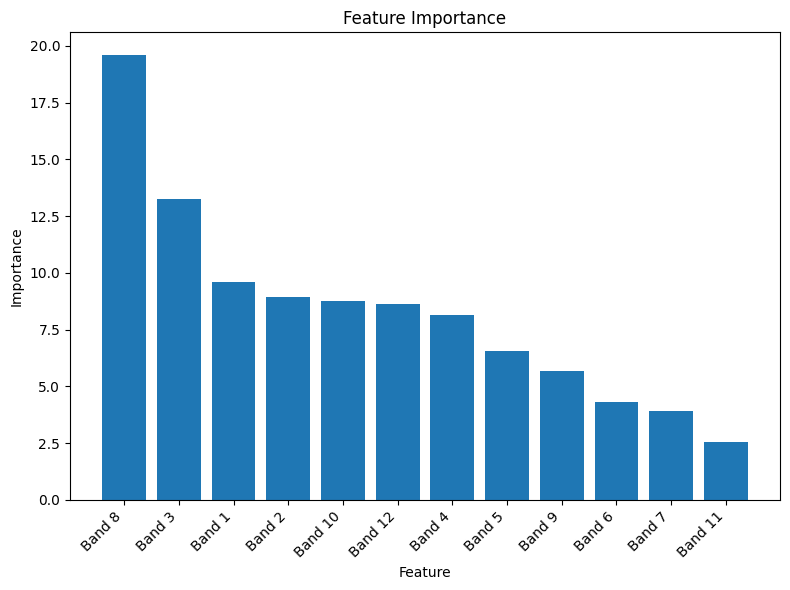

In [ ]:
# Get feature importance
feature_importance = model.get_feature_importance()

# Sort feature importance in descending order
sorted_idx = np.argsort(feature_importance)[::-1]
sorted_importance = feature_importance[sorted_idx]

# Create feature names for the 12 bands
feature_names = [f"Band {i}" for i in range(1, 13)]
sorted_feature_names = [feature_names[i] for i in sorted_idx]

# Plot
plt.figure(figsize=(8, 6))
plt.bar(sorted_feature_names, sorted_importance)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature Importance")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

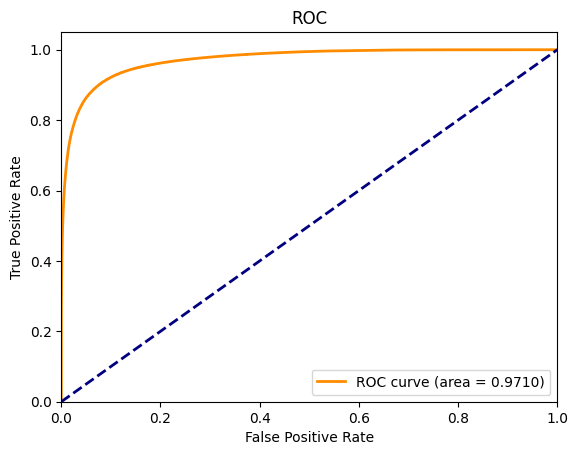

In [ ]:
# plot roc curve and compute auc
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.4f)' % roc_auc )
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

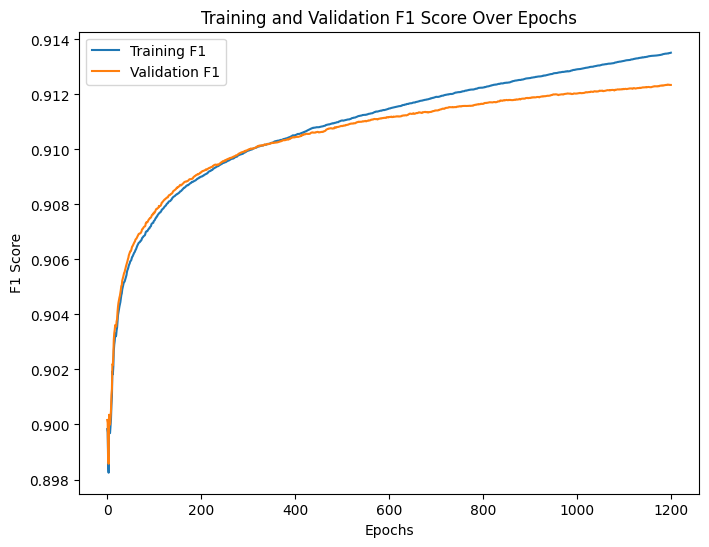

In [ ]:
# Training and Validation F1 Score
plt.figure(figsize=(8, 6))
plt.plot(model.get_evals_result()['learn']['F1'], label='Training F1')
plt.plot(model.get_evals_result()['validation']['F1'], label='Validation F1')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('Training and Validation F1 Score Over Epochs')
plt.legend()
plt.show()

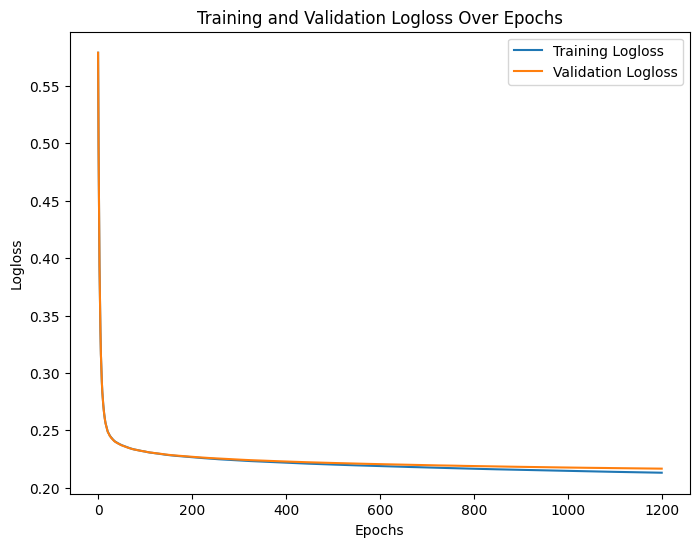

In [ ]:
# plot loss over epocs:
plt.figure(figsize=(8, 6))
plt.plot(model.get_evals_result()['learn']['Logloss'], label='Training Logloss')
plt.plot(model.get_evals_result()['validation']['Logloss'], label='Validation Logloss')
plt.xlabel('Epochs')
plt.ylabel('Logloss')
plt.title('Training and Validation Logloss Over Epochs')
plt.legend()
plt.show()

<Figure size 600x400 with 0 Axes>

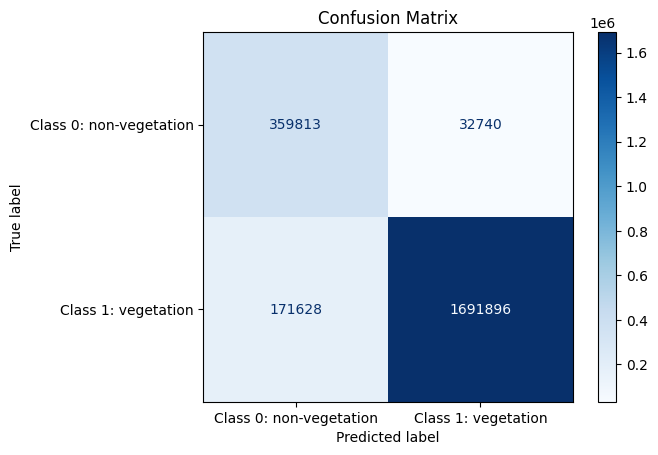

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(class_labels_binary.values()))

# Plot the confusion matrix
plt.figure(figsize=(6, 4))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()

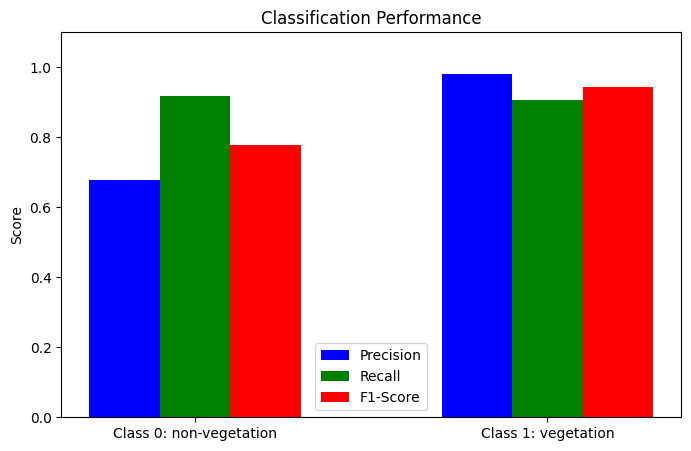

In [ ]:
# metrics for 0 and 1
report = classification_report(y_test, y_pred, target_names=class_labels_binary.values(), output_dict=True)

# Extract metrics from the classification report
categories = list(class_labels_binary.values())  # class labels
precision = [report[label]['precision'] for label in categories]
recall = [report[label]['recall'] for label in categories]
f1_score = [report[label]['f1-score'] for label in categories]

# Bar width and positions
x = np.arange(len(categories))
width = 0.2

# Create bar plot
fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(x - width, precision, width, label="Precision", color='blue')
ax.bar(x, recall, width, label="Recall", color='green')
ax.bar(x + width, f1_score, width, label="F1-Score", color='red')

# Format
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.set_ylabel("Score")
ax.set_ylim(0, 1.1)
ax.legend()
plt.title("Classification Performance")
plt.show()

# Upload test images to see how the model performs

Processing image 1/13: 1.tif


c:\Users\Andreea\AppData\Local\Programs\Python\Python312\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


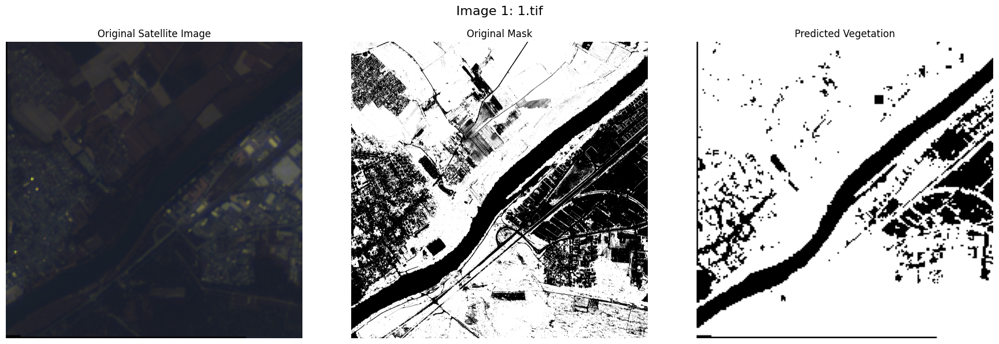

Processing image 2/13: 10.tif


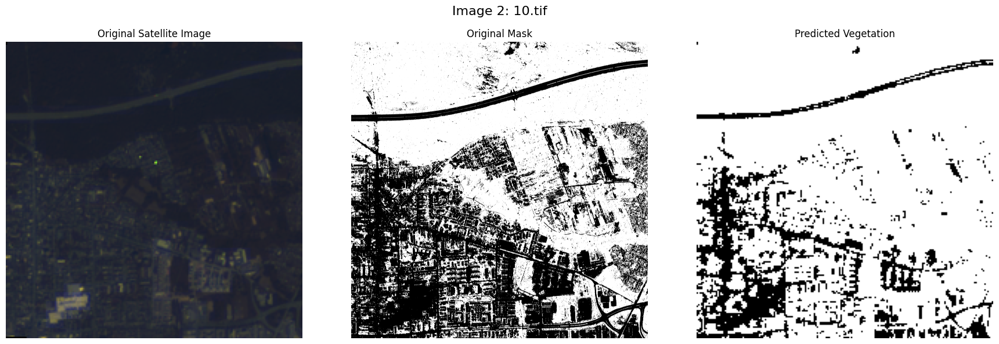

Processing image 3/13: 11.tif


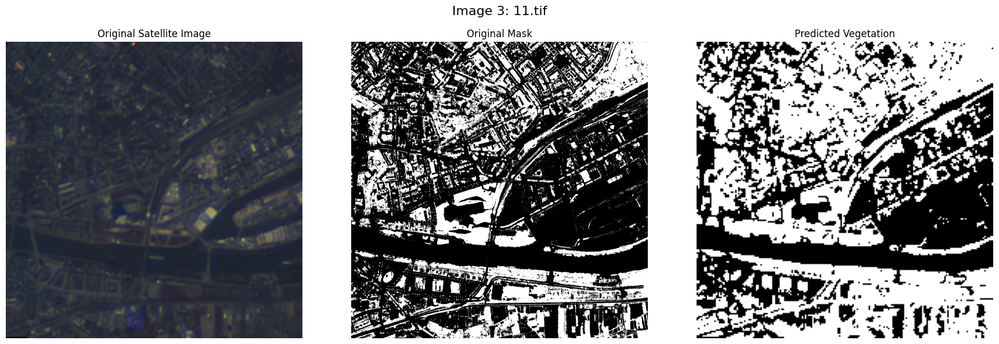

Processing image 4/13: 12.tif


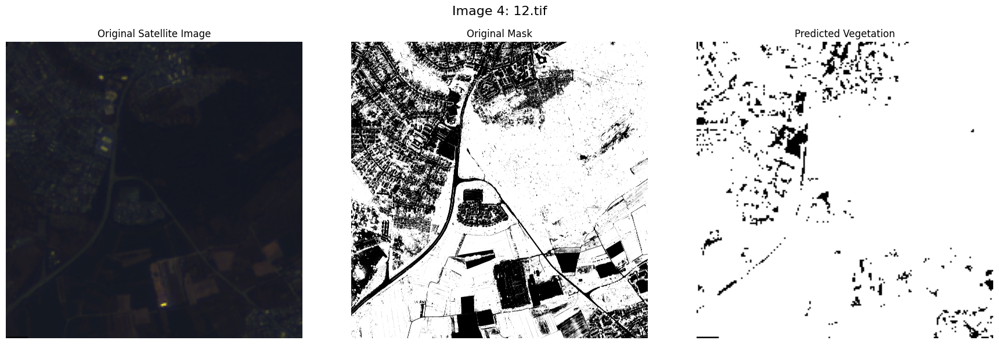

Processing image 5/13: 13.tif


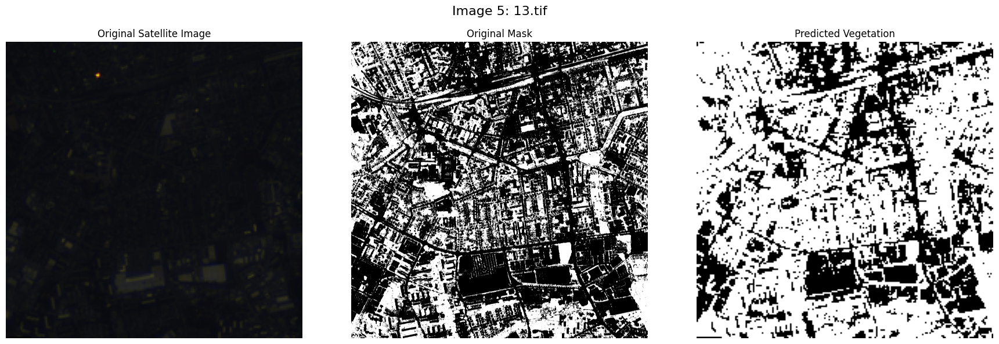

Processing image 6/13: 2.tif


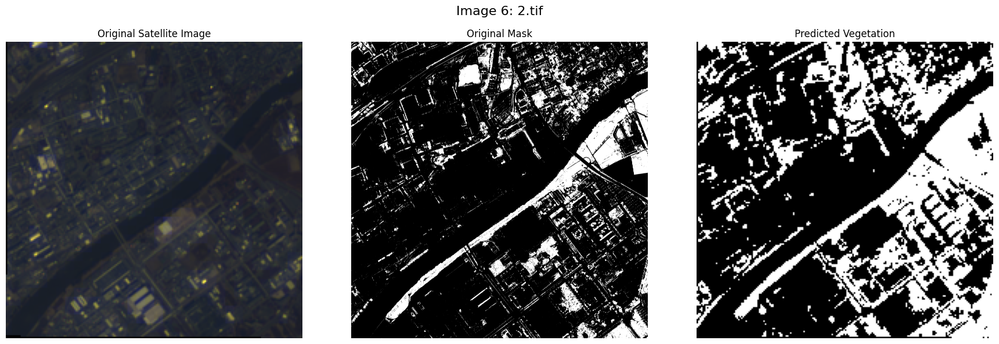

Processing image 7/13: 3.tif


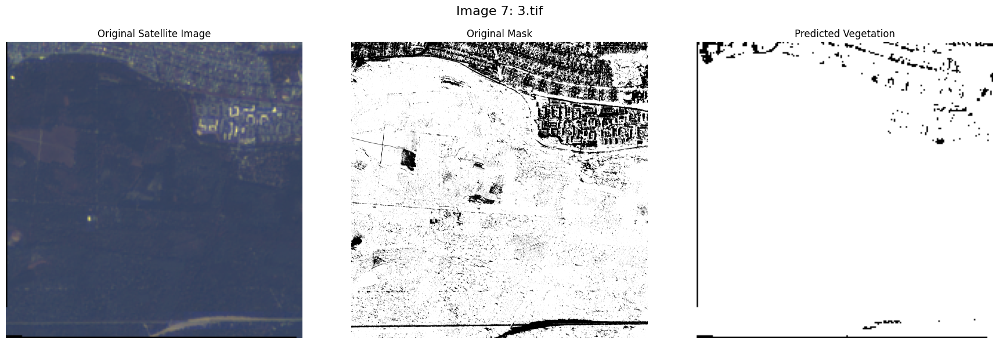

Processing image 8/13: 4.tif


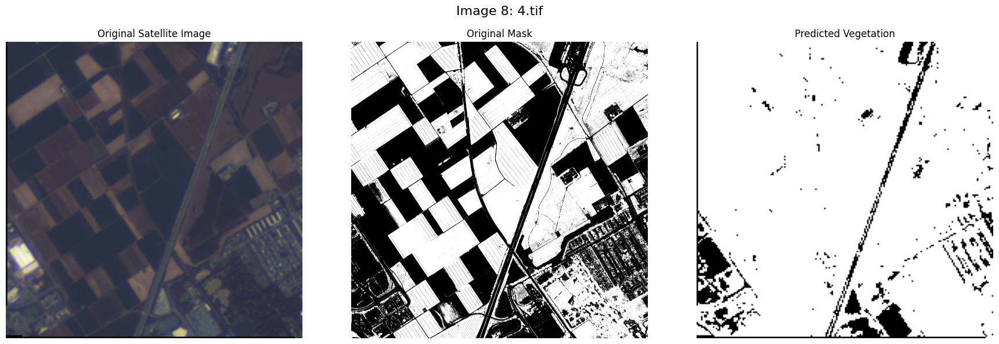

Processing image 9/13: 5.tif


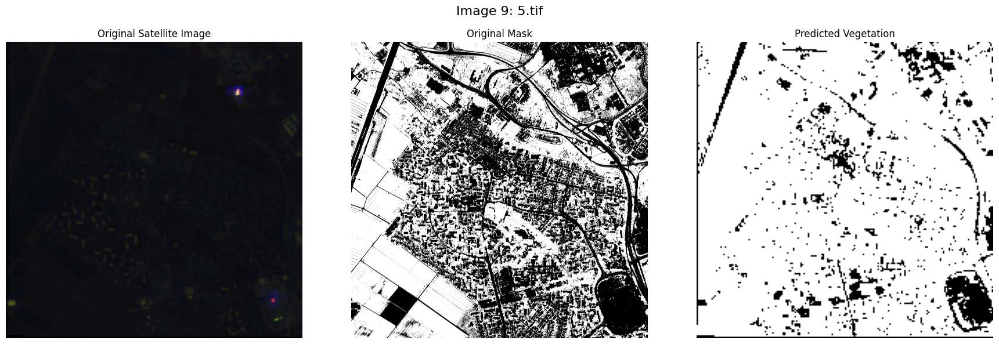

Processing image 10/13: 6.tif


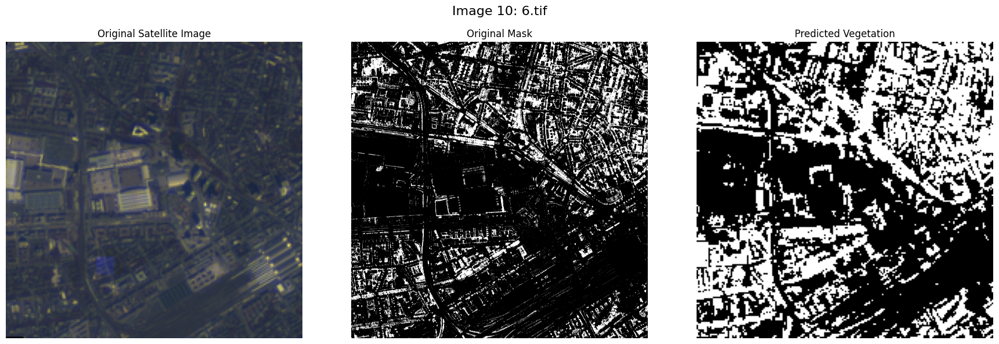

Processing image 11/13: 7.tif


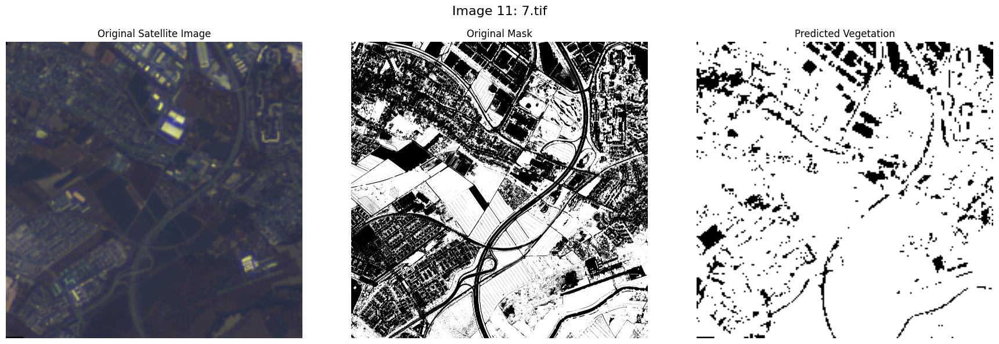

Processing image 12/13: 8.tif


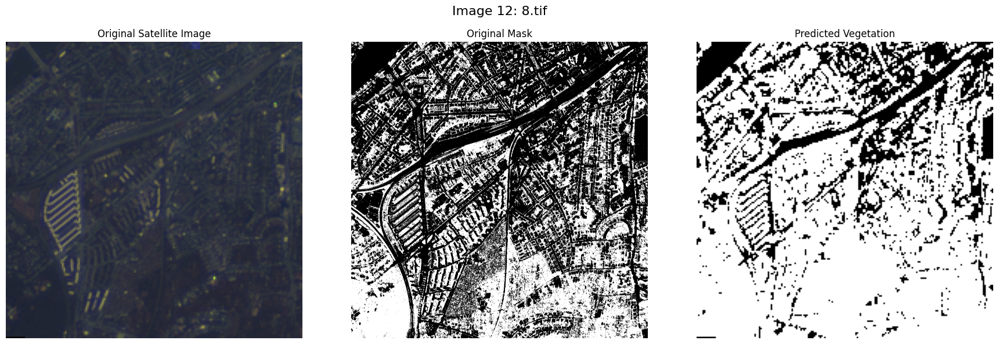

Processing image 13/13: 9.tif


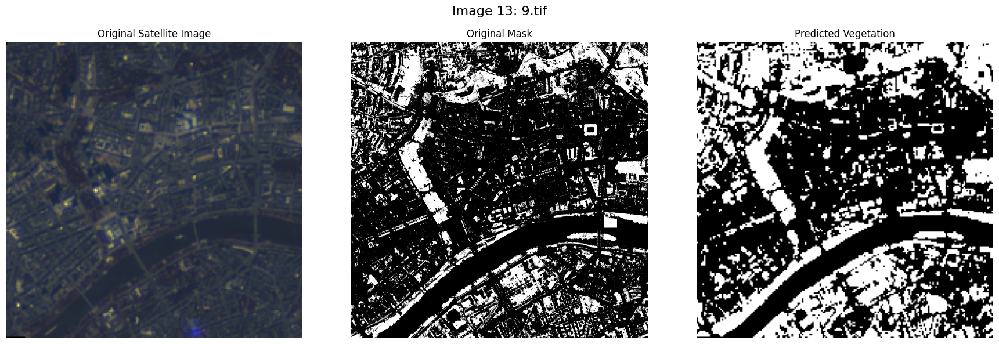

In [ ]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from catboost import CatBoostClassifier

# Paths to the new image and mask folders
new_image_path = '/content/sample_data/Sentinel2'
new_mask_path = '/content/sample_data/SentinelBinary' 

# Load the trained CatBoost model
model = CatBoostClassifier()
model.load_model('catboost.cbm')

# Get the list of image and mask files
image_files = sorted(os.listdir(new_image_path))
mask_files = sorted(os.listdir(new_mask_path))

# Check for matching image-mask pairs
if len(image_files) != len(mask_files):
    raise ValueError("Mismatch in the number of images and masks!")

# Loop through each image-mask pair
for idx, (image_file, mask_file) in enumerate(zip(image_files, mask_files)):
    print(f"Processing image {idx + 1}/{len(image_files)}: {image_file}")

    # Load the new image using rasterio
    new_image_path_full = os.path.join(new_image_path, image_file)
    with rasterio.open(new_image_path_full) as src:
        new_image = src.read()  # Read all bands


    # Select first 12 bands
    new_image_12_bands = new_image[:12, :, :]

    # Flatten the image into (num_pixels, num_bands)
    height, width = new_image_12_bands.shape[1], new_image_12_bands.shape[2]
    new_image_flattened = new_image_12_bands.reshape(12, -1).T

    # Predict on the new image
    predictions_flattened = model.predict(new_image_flattened)
    predictions = predictions_flattened.reshape(height, width)


    # Load the corresponding mask using rasterio
    mask_path_full = os.path.join(new_mask_path, mask_file)
    with rasterio.open(mask_path_full) as src:
        mask = src.read()[0]

    # Prepare the original RGB image for visualization
    rgb_bands = new_image[[2, 1, 0], :, :]  # Extract Red, Green, Blue bands (BGR -> RGB)
    rgb_image = np.transpose(rgb_bands, (1, 2, 0))  # Transpose to (height, width, 3)

    # Normalize the RGB image for visualization
    rgb_image = rgb_image / rgb_image.max()

    # Create a figure with 3 columns for visualization
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot the original RGB image
    axes[0].imshow(rgb_image)
    axes[0].set_title("Original Satellite Image")
    axes[0].axis('off')

    # Plot the original mask
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title("Original Mask")
    axes[1].axis('off')

    # Plot the model's predictions
    axes[2].imshow(predictions, cmap='gray', vmin=0, vmax=1)
    axes[2].set_title("Predicted Vegetation")
    axes[2].axis('off')

    # Add a title for the entire figure
    fig.suptitle(f"Image {idx + 1}: {image_file}", fontsize=16)

    # Show the plots
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


In [ ]:
from dagshub.notebook import save_notebook
save_notebook(repo="Omdena/FrankfurtGermanyChapter_UrbanGreenSpaceMappping",
              path="TeamA/catboost_model.ipynb", commit_message="catboost_model")